## MEANDERPY


'meanderpy' is a Python module that implements a simple numerical model of meandering, the one described by Howard & Knutson in their 1984 paper "Sufficient Conditions for River Meandering: A Simulation Approach". This is a kinematic model that is based on computing migration rate as the weighted sum of upstream curvatures; flow velocity does not enter the equation. Curvature is transformed into a 'nominal migration rate' through multiplication with a migration rate (or erodibility) constant; in the [Howard and Knutson, 1984] paper this is a nonlinear relationship based on field observations that suggested a complex link between curvature and migration rate.

In the 'meanderpy' module we use a simple linear relationship between the nominal migration rate and curvature, as recent work using time-lapse satellite imagery suggests that high curvatures result in high migration rates
[Sylvester et al., 2019].

You can read more about the model, find references at: https://csdms.colorado.edu/wiki/Model:Meanderpy.

Learning Objectives: 
- learn about the planview morphology of meandering rivers
- learn how to quantify sinuosity, relationship between slope, 
- learn how meandering rivers migrate 

Python skills: 
- learn how to save a plot, and make a movie from a model simulation
- implement basic calculations of river hydraulics and morphological relationships

The core of the notebook has originally been created by Zoltan Sylvester. 
It was modified for Sedimentary System Modeling by Irina Overeem, October 2, 2019.

[Sylvester et al., 2019]: https://pubs.geoscienceworld.org/gsa/geology/article/47/3/263/568705/high-curvatures-drive-river-meandering
[Howard and Knutson, 1984]: http://dx.doi.org/10.1029/WR020i011p01659




In [ ]:
import meanderpy as mp
import matplotlib.pyplot as plt
import numpy as np

#NOTE THIS LINE HAS BEEN ADDED TO ALLOW FOR INTERACTIVE INPUT
#THIS ONLY WORKS ON LOCAL PC NOT ON JUPYTERHUB
#%matplotlib qt

In [ ]:
help(mp)

## Input parameters

In [ ]:
W = 200.0                    # channel width (m), original setting 200m
D = 12.0                     # channel depth (m), original setting 16m
pad = 100                    # padding (number of nodepoints along centerline)
deltas = 50.0                # sampling distance along centerline
nit = 2000                   # number of iterations
Cf = 0.022                    # dimensionless Chezy friction factor
crdist = 2.0*W                 # threshold distance at which cutoffs occur
kl = 60.0/(365*24*60*60.0)   # migration rate constant (m/s)
kv =  1.0E-11                # vertical slope-dependent erosion rate constant (m/s)
dt = 0.05*365*24*60*60.0     # time step (s)
dens = 1000                  # density of water (kg/m3)
saved_ts = 30                # which time steps will be saved
n_bends = 30                 # approximate number of bends you want to model
Sl = 0.01                    # initial slope (matters more for submarine channels than rivers)
t1 = 500                     # time step when incision starts
t2 = 700                     # time step when lateral migration starts
t3 = 1400                    # time step when aggradation starts
aggr_factor = 4e-9           # aggradation factor (earlier set at 2)

## Initialize model

In [ ]:
from imp import reload
reload(mp)
# This initialzation can create a straight line, with some noise added. 
# However, a Channel can be created (and then used as the first channel in a ChannelBelt) using any set of x,y,z,W,D variables.
ch = mp.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel for zero-th timestep
chb = mp.ChannelBelt(channels=[ch],cutoffs=[],cl_times=[0.0],cutoff_times=[]) # create channel belt object

## Run a base-case simulation

The core functionality of 'meanderpy' is built into the 'migrate' method of the 'ChannelBelt' class. This is the function that computes migration rates and moves the channel centerline to its new position. The last Channel of a ChannelBelt can be further migrated through applying the 'migrate' method to the ChannelBelt instance.

In [ ]:
# run the migrate method on your 
chb.migrate(nit,saved_ts,deltas,pad,crdist,Cf,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration
fig = chb.plot('strat',20,60) # plotting

In [ ]:
# get some basic information on the plot method for the channel belt object
help(chb.plot)

In [ ]:
# migrate an additional 1000 iterations and plot stratigraphic results
chb.migrate(1000,saved_ts,deltas,pad,crdist,Cf,kl,kv,dt,dens, t1,t2,t3,aggr_factor)
fig = chb.plot('strat',20,60)

ChannelBelt objects can be visualized using the 'plot' method. This creates a map of all the channels and cutoffs in the channel belt; there are two styles of plotting: a 'stratigraphic' view and a 'morphologic' view (see below). The morphologic view tries to account for the fact that older point bars and oxbow lakes tend to be gradually covered with vegetation.

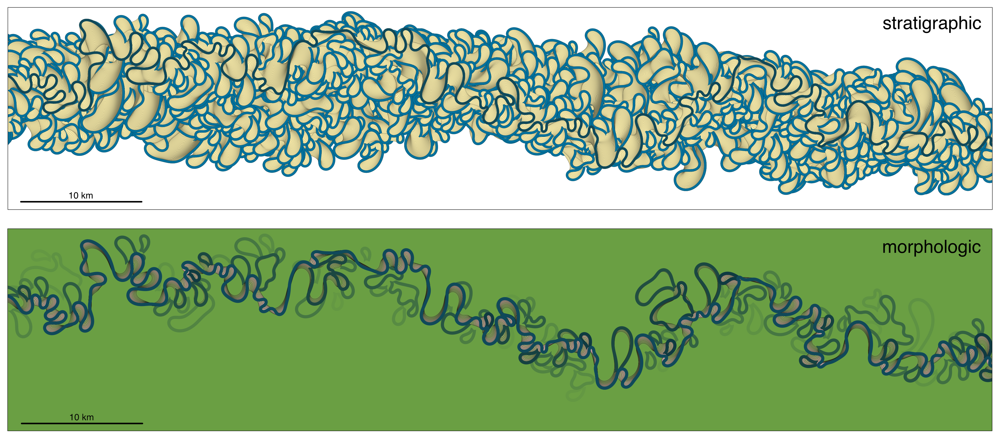


## <font color = green> Assignment 1 </font> 
Describe the plot you have generated with the meanderpy simulation. What is the approximate width of the channel belt? How many cut-offs have been generated? Over how many iterations? 

And lastly, is there any indication that the model does not mimick real processes well? Explain what is off and form an hypothesis about why this is.

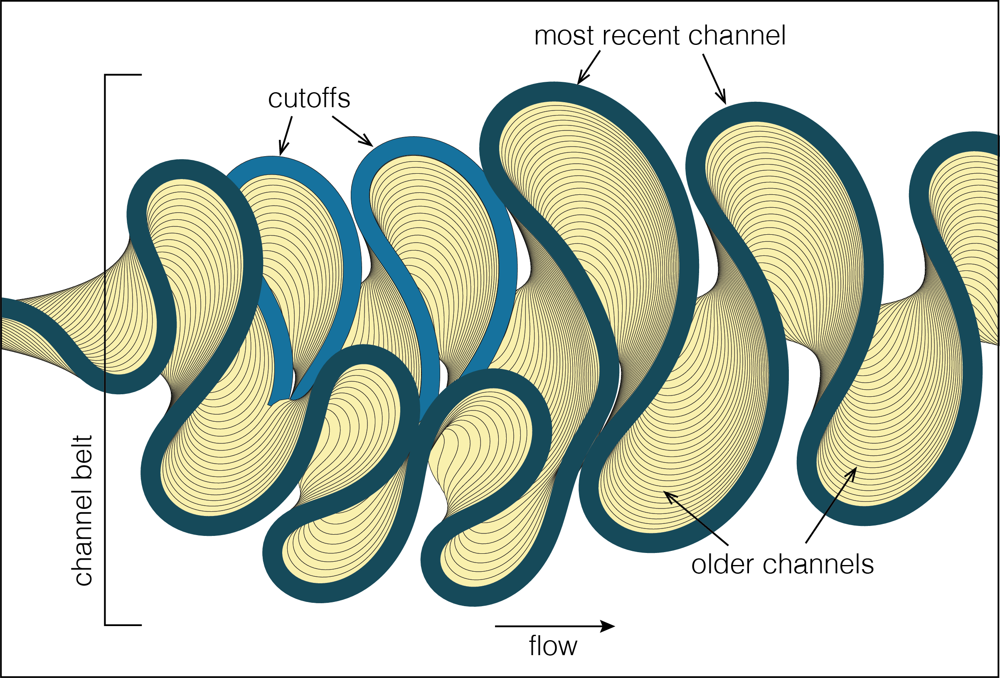

What is the approximate width of the channel belt? 
How many cut-offs have been generated? Over how many iterations? 

And lastly, is there any indication that the model does not mimick real processes well? 
Explain what is off and form an hypothesis about why this is.

In [ ]:
# migrate an additional 100 iterations and plot morphology with revegetated previous channel pointbars and oxbows
chb.migrate(100,saved_ts,deltas,pad,crdist,Cf,kl,kv,dt,dens, t1,t2,t3,aggr_factor)
fig = chb.plot('morph',5,10)

#how many years is a 100 iterations in this model set up? How can you find out?

## <font color = green> Assignment 2 </font> 
Write code to print out your generated figure as a PNG file. 

Describe the morphological plot you have generated. What do you see? Why is this plot different from the previous one? What values did you set for rate of vegetation growth in the floodplain? Do you think those timespans are realistic values for the revegetation? 

How many cutoffs do you see?

In [ ]:
#How we create a saved image
fig.savefig('InitialModel.png')

In [ ]:
#  Answers to Assignment 2

print(chb.cl_times) #look at last one to get estimate of total model time elapsed (would need to change elapsed_ts = 1)

print("\n", len(chb.channels))
print(chb.cutoff_times[-1])
print(len(chb.cutoffs))


(dt*3100)/(365*24*3600) #to calc. total time of model in YEARS
#how did I get the above number? What does 3100 come from? What does this represent?

## <font color = green> Assignment 3 </font> 
What is the estimated sinuosity of the active channel? 
Recall: sinuosity = channel center line length/valley length

In [ ]:
# Ok let's look at two ways to estimate sinuoysity. First we need to find the channel length
# this means we need to figure out how this model stores the data so let's look at what is in chb
help(chb)



# Python Class - Object orientated programming
ok now looking at this long print out, we can see several functions that we can call on chb from making a movie 
to migrating our channel (aka running the model) to plotting the output.

let's focus on the __init__ fucntion shown at the top of the print out.
 https://www.geeksforgeeks.org/__init__-in-python/ or https://docs.python.org/2/tutorial/classes.html provides
 useful information about init and classes.
 
 But simply put, you can create a python script that creates any type of object called a "Class Object". In our case, they created the "ChannelBelt" object. This object has several inbuilt pieces of information that are tagged with it - these pieces of information are all stored in this __init__ function. So any channel-belt object will have:
 1. Channels (channelbelt.channels)
 2. Cutoffs (channelbelt.cutoffs)
 3. Ages of channels (channelbelt.cl_times)
 4. Ages of Cutoffs ((channelbelt.cutoff_times)
 
 Funnily enough, each of the above 4 things are ALSO class objects (https://github.com/zsylvester/meanderpy/blob/master/meanderpy/meanderpy.py)
 
 If you look here you can see that both Channel and Cutoff Class objects contain an additional 5 variables/information:
 1. W - channel width
 2. D - channel depth
 3. x,y,z - coordinates of the centerline of the object. 
 
 This starts to tell us where and how data are stored in this script/model, and what functions we might be able to call to calculate certain things in this model.

In [ ]:
# Ok let's look at two ways to estimate sinuoysity. First we need to find the channel length

# use the below function (caclDist) to calculate the distance of the centerline.
def calcDist(x,y):
    """ function for computing the distance of the centerline of a given channel of x & y points
    inputs: 
    x - x points from a channel object (channel.x)
    y - y points from a channel object (channel.y)
    return: 
    cumd - cumulative (total) distance of that object"""
    d = np.sqrt((x[0:-1]-x[1:])**2 + (y[0:-1]-y[1:])**2)
    cumd = np.cumsum(d)
    return cumd[-1]

#Please explain what a function does, and what is the syntax (the format) used when creating a function in python.
# Why do we use functions?

dist = calcDist(chb.channels[-1].x, chb.channels[-1].y)
print(dist)
print(len(chb.channels[-1].x)*deltas)
#compare the above two printouts, "dist" and "chb.channels[-1].x)*deltas"
# what are these two calculations? Why are they so similar? What is the deltas variable represnt?

val_len = np.sqrt((chb.channels[-1].x[-1]-chb.channels[-1].x[0])**2 + (chb.channels[-1].y[-1]-chb.channels[-1].y[0])**2)
#how am I calculating valley length? What does that mean?

print(val_len)
print((chb.channels[-1].x[-1]-chb.channels[-1].x[0]))
#what are the above two versions of valley length? What are the differences in these calculations?

sin = dist/(chb.channels[-1].x[-1]-chb.channels[-1].x[0])
print('this sinuousity is: ', sin)

In [ ]:
#redo sinuousity measurement -- account for part of river that is STRAIGHT and shouldn't be included in calc. of sinuosity
#find where it starts to vary in y from more than 2W
co = chb.channels[-1]
x = co.x
y = co.y
k = (y > 2*W) | (y < 2*-W)

#find first instance of k 1 and last instance
dist = calcDist(x[k], y[k])
xx = x[k]
yy = y[k]
print(dist)
#val_len = np.sqrt((chb.channels[-1].x[-1]-chb.channels[-1].x[0])**2 + (chb.channels[-1].y[-1]-chb.channels[-1].y[0])**2)
val_len = np.sqrt((xx[-1]-xx[0])**2 + (yy[-1]-yy[0])**2)
print(dist/val_len)

In [ ]:
#now let's create a movie!
chb.create_movie(5000,30000,'strat','basecase','movie',10,100,2,2000)
#what has happened? Go check your jupyter notebook folder - what do you see?

# Set up a case to mimick the Colorado River near Kremmling, CO

In out first practive notebook we looked at a USGS daily discharge record for the Colorado River near Kremmling, CO. 
In that zone, the Colorado River has a meandering morphology.

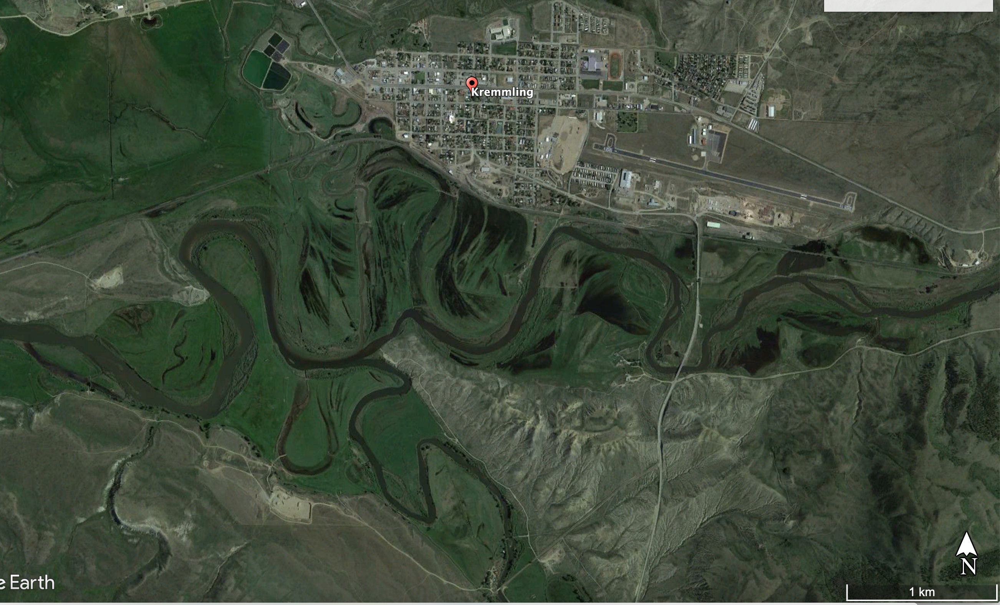

## <font color = green> Assignment 4</font> 

To set the width and depth for the Colorado River at Kremmling, we can use some hydraulic geometry relationships. These relationships relate river width, W, river depth, D to its discharge, Q.

From the USGS record I sellected all peak river discharges at the gauge for 1964-2016, then I calculated the mean of those peaks and the standard deviation:
mean Qpeak	5535.014286 cuft/sec
std Qpeak	4523.502332 cuft/sec

Convert these river discharge statistics to m3/sec

Discuss how this is not the common way of defining bankfull discharge.
How would you have determined bankfull discharge?

In [ ]:
#Your code to convert peak discharge and its standard deviation goes here
# print out the answer



In [ ]:
# Your discussion on Qbf goes here. 

## <font color = green> Assignment 5</font> 

 A hydraulic geometry relationship between bankfull discharge and river width is given as Wb=3.38Qb^.54
 based on Andrews 1984 data, where Db = 0.25 * Qb ^ 0.34 and Ubk = 1.20 * Qb ^ 0.13


Write a calculation for width based on the mean peak discharge given above.

In [ ]:
# your code for the calculation of width W from the mean of all peak discharges goes here


In [ ]:
#ok so now how do we calculate the bankfull depth?


## <font color = green> Assignment 6</font> 
Manipulate the meanderpy model inputs so that the width (W) and depth (D) of the initial channel 
are more similar for the case of the Colorado River at Kremmling 

In [ ]:
import meanderpy as mpco
import matplotlib.pyplot as plt

In [ ]:
# Manipulate the meanderpy model inputs so that the width (W) and depth (D) of the initial channel 
# are more similar for the case of the Colorado River at Kremmling 

W = 200                    # channel width (m), original setting 200m
D = 16                     # channel depth (m), original setting 16m
pad = 100                    # padding (number of nodepoints along centerline)
deltas = 50.0                # sampling distance along centerline
nit = 2000                   # number of iterations
Cf = 0.022                    # dimensionless Chezy friction factor
crdist = 2.0*W                 # threshold distance at which cutoffs occur
kl = 60.0/(365*24*60*60.0)   # migration rate constant (m/s)
kv =  1.0E-11                # vertical slope-dependent erosion rate constant (m/s)
dt = 0.05*365*24*60*60.0     # time step (s)
dens = 1000                  # density of water (kg/m3)
saved_ts = 30                # which time steps will be saved
n_bends = 30                 # approximate number of bends you want to model
Sl = 0.01                    # initial slope (matters more for submarine channels than rivers)
t1 = 500                     # time step when incision starts
t2 = 700                     # time step when lateral migration starts
t3 = 14000                    # time step when aggradation starts
aggr_factor = 2              # aggradation factor (it kicks in after t3)

In [ ]:
from imp import reload
reload(mpco)
# This initialzation can create a straight line, with some noise added. 
# However, a Channel can be created (and then used as the first channel in a ChannelBelt) using any set of x,y,z,W,D variables.
chco = mpco.generate_initial_channel(W,D,Sl,deltas,pad,n_bends) # initialize channel for zero-th timestep
chbco = mpco.ChannelBelt(channels=[ch],cutoffs=[],cl_times=[0.0],cutoff_times=[]) # create channel belt object

In [ ]:
# run the migrate method on your new simulation 
chbco.migrate(nit,saved_ts,deltas,pad,crdist,Cf,kl,kv,dt,dens,t1,t2,t3,aggr_factor) # channel migration
fig = chbco.plot('strat',20,60) # plotting

In [ ]:
# your code to create a morphological plot for your realization goes here

In [ ]:
plt.show(fig)

#save your figure 

## <font color = green> Assignment 7</font> 
So you manipulated the meanderpy model inputs so that the width (W) and depth (D) of the initial channel 
are more similar for the case of the Colorado River at Kremmling. 
Then you ran the simulation. How does it compare visually to the Colorado River at Kremmling? 
Go to google earth, find the location and measure the channel width at a couple of places. How does it compare?

In [ ]:
# your discussion of visual similarity goes here.
# report your measured channel widths of the realworld channel here
# how does the sinuosity of the simulated channel and the real-world channel at this stretch compare?
# What would be reasons for a mismatch?
# recalculate sinuosity of your model outputs. Also calculate sinuosity on google earth! Compare these values
# what do your results mean>

## <font color = green> Assignment 8 </font> 
Read the uploaded Chapter 7 on shapping channel geometry, using table 7.3 and the google earth images, choose which channel geometry & hydraulics equation you think best fits for the Colorado River at Kremmling. Create a new model to test your new values of channel width and depth. How does this compare to Assignment 5 & 6? What else might impact your results? What else might you change to better fit the real-world?

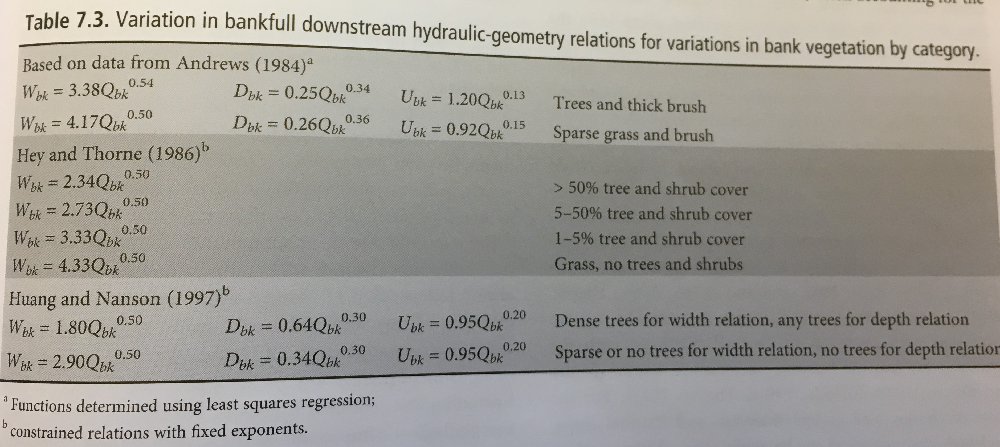

In [ ]:
#put your code here to create inputs for a new model

In [ ]:
#put your code here to create that new model

In [ ]:
#put your code here to plot your model

In [ ]:
#answer the questions for Assignment 8 here

## <font color = green> Assignment 9 </font> 

Choose one last variable to play with - create a new model, run it, and plot it with a new value for this input variable (hint look at changing the Chezy coefficient or the migration rate or the time steps

In [ ]:
#put your code here to create inputs for a new model


In [ ]:
#put your code here to create that new model


In [ ]:
#put your code here to plot your model

# ALL DONE! 
this code was heavily adapted from Zoltan Sylvestre at Texas Bureau of Economic Geology and Irina Overeem at University of Colorado.